In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


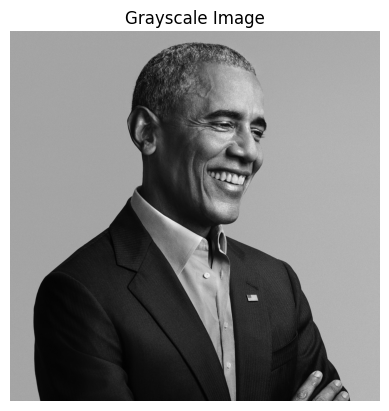

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray

# Load the image
image_path = "/content/drive/MyDrive/Optimization_Compressed_Sense/obama.jpg"
image = Image.open(image_path)

#image = image.resize((1024,1024)) # Resized images for performance reasons
#image = image.rotate(270, expand=True) #Our photos got rotated for some reason, rotate them back
# Convert the image to grayscale, and put it in a numpy array
image_gray = rgb2gray(np.array(image))

# Display the original grayscale image
plt.imshow(image_gray, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')
plt.show()

100%|██████████| 1000/1000 [00:08<00:00, 117.21it/s]
/tmp/ipython-input-3-2423357358.py:66: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_reconst = psnr(image_gray, image_reconstructed)


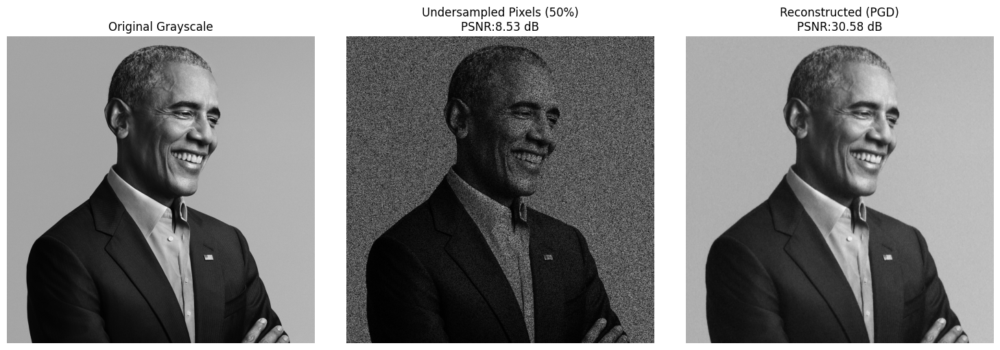

100%|██████████| 1000/1000 [00:04<00:00, 213.26it/s]


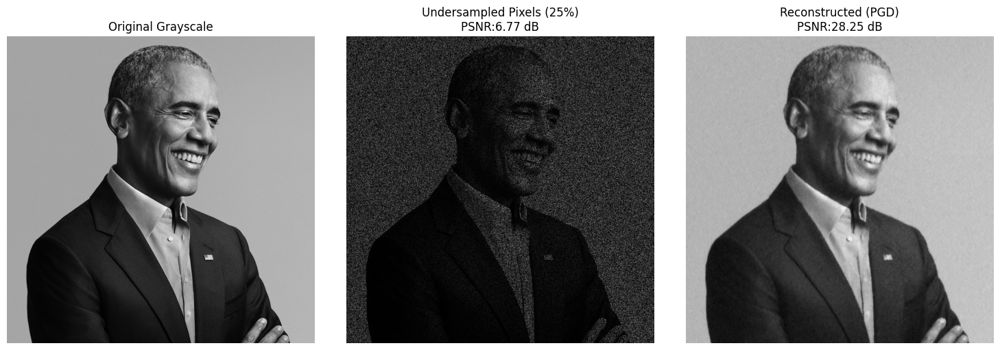

100%|██████████| 1000/1000 [00:04<00:00, 218.37it/s]


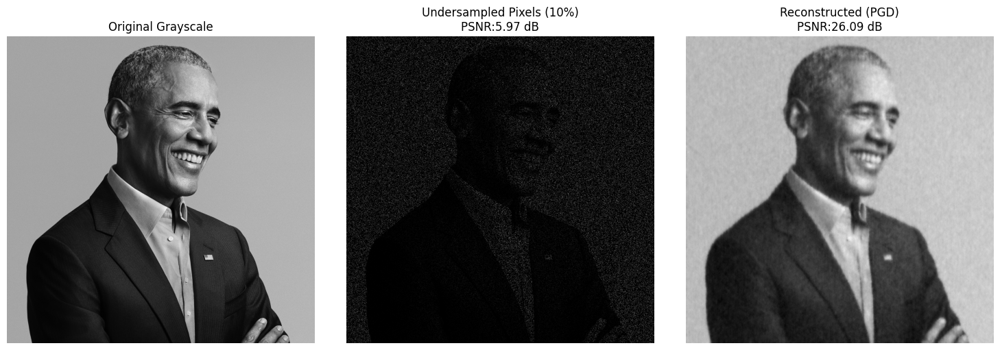

100%|██████████| 1000/1000 [00:05<00:00, 198.74it/s]


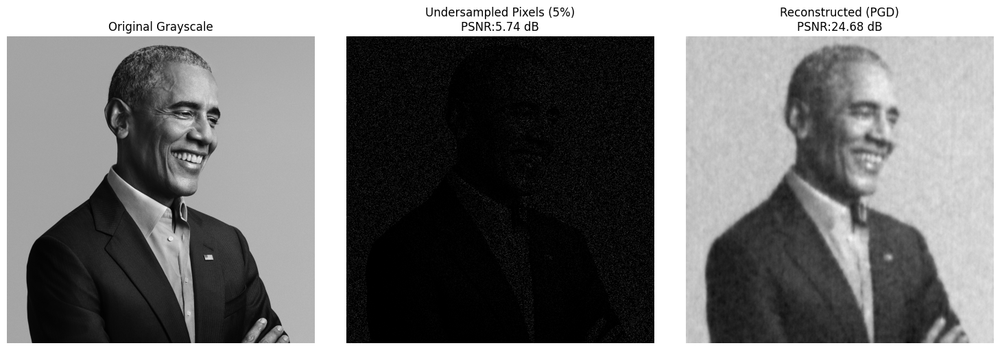

100%|██████████| 1000/1000 [00:04<00:00, 218.29it/s]


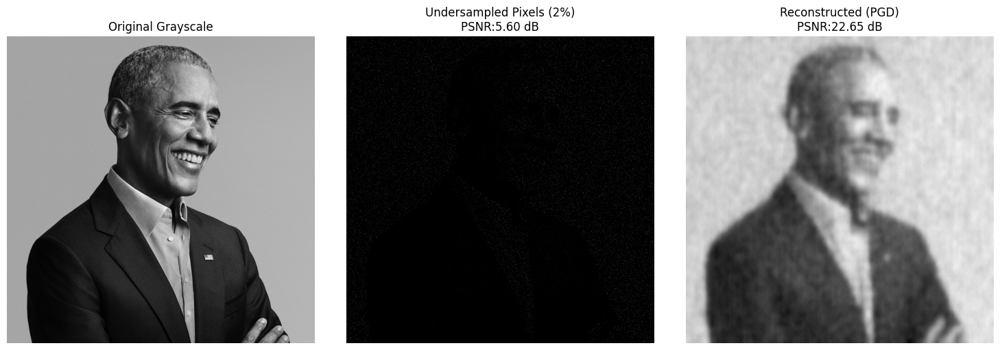

100%|██████████| 1000/1000 [00:04<00:00, 218.53it/s]


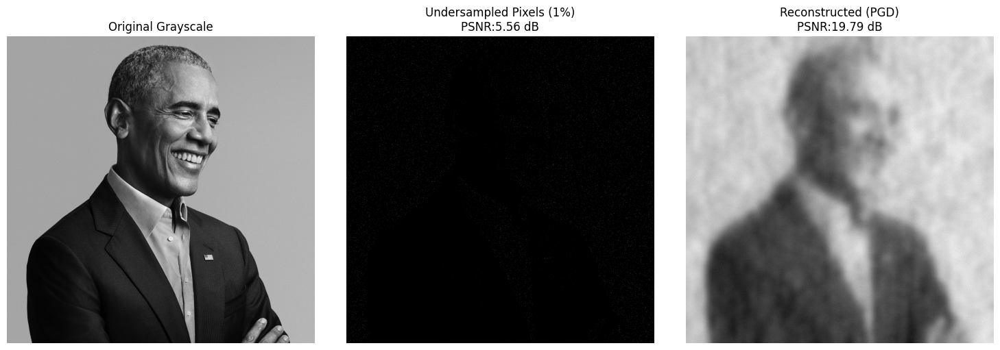

In [ ]:
# Test for running on GPU:
import numpy.random as npr
import scipy.fft as fft
from numpy.linalg import norm
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr
import cupy as cp
from cupyx.scipy.fft import dctn, idctn

def dct2_gpu(x):
    return dctn(x, type=2, norm='ortho')

def idct2_gpu(x):
    return idctn(x, type=2, norm='ortho')

def soft_threshold_gpu(x, thresh):
    return cp.sign(x) * cp.maximum(cp.abs(x) - thresh, 0)

def proximal_gradient_sparse_pixels_gpu(y, mask, image_shape, lamb=0.01, step=1.0, max_iter=300):
    alpha = cp.zeros(image_shape, dtype=cp.float32)
    for _ in tqdm(range(max_iter)):
        x = idct2_gpu(alpha)
        residual = cp.zeros_like(x)
        residual[mask] = x[mask] - y
        grad = dct2_gpu(residual)
        alpha -= step * grad
        alpha = soft_threshold_gpu(alpha, lamb * step)
    return idct2_gpu(alpha)



# Assume image_gray is a NumPy array
image_cp = cp.asarray(image_gray)


# Main process steps
def reconstruct_by_sampling_ratio(sampling_ratio, image_gray):

    # Create mask
    mask_cp = cp.asarray(npr.rand(*image_gray.shape) < sampling_ratio)
    y_cp = image_cp[mask_cp]

    # Run reconstruction
    reconstructed_gpu = proximal_gradient_sparse_pixels_gpu(y_cp, mask_cp, image_gray.shape, lamb=0.02, max_iter=1000)

    # Back to NumPy for plotting
    image_reconstructed = cp.asnumpy(reconstructed_gpu)
    mask_pixels = cp.asnumpy(mask_cp)

    return sampling_ratio, mask_pixels, image_reconstructed

def plot_result(image_gray, sampling_ratio, mask_pixels, image_reconstructed):

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(image_gray, cmap='gray')
    axs[0].set_title("Original Grayscale")
    axs[0].axis('off')

    masked_image = np.zeros_like(image_gray)
    masked_image[mask_pixels] = image_gray[mask_pixels]
    psnr_masked = psnr(image_gray, masked_image)
    axs[1].imshow(masked_image, cmap='gray')
    axs[1].set_title(f"Undersampled Pixels ({sampling_ratio*100:.0f}%)\nPSNR:{psnr_masked:.2f} dB")
    axs[1].axis('off')

    psnr_reconst = psnr(image_gray, image_reconstructed)
    axs[2].imshow(image_reconstructed, cmap='gray')
    axs[2].set_title(f"Reconstructed (PGD)\nPSNR:{psnr_reconst:.2f} dB")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()
    #plt.savefig(f"/content/drive/MyDrive/Optimization_Compressed_Sense/obama_compressed{sampling_ratio*100:.0f}%.png")

# Sampling ratios to test

sampling_ratios = [0.5, 0.25, 0.1, 0.05, 0.02, 0.01]

# For loop to test on the above values

for sampling_ratio in sampling_ratios:
    sampling_ratio, mask_pixels, image_reconstructed = reconstruct_by_sampling_ratio(sampling_ratio, image_cp)
    plot_result(image_gray, sampling_ratio, mask_pixels, image_reconstructed)

100%|██████████| 1000/1000 [02:31<00:00,  6.59it/s]


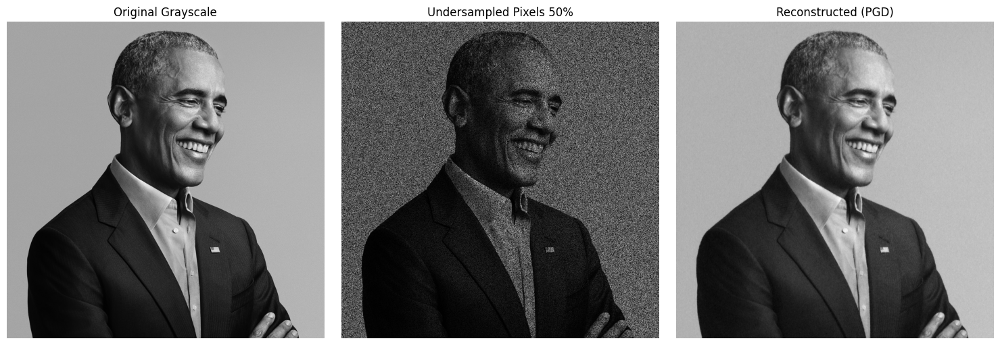

100%|██████████| 1000/1000 [02:28<00:00,  6.71it/s]


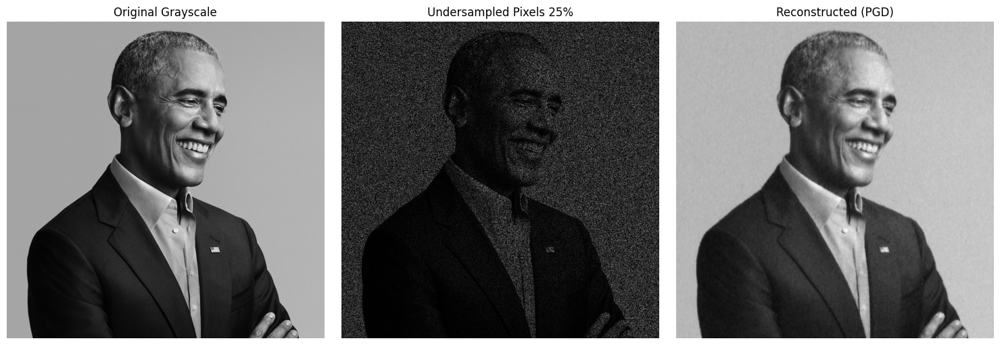

100%|██████████| 1000/1000 [02:23<00:00,  6.96it/s]


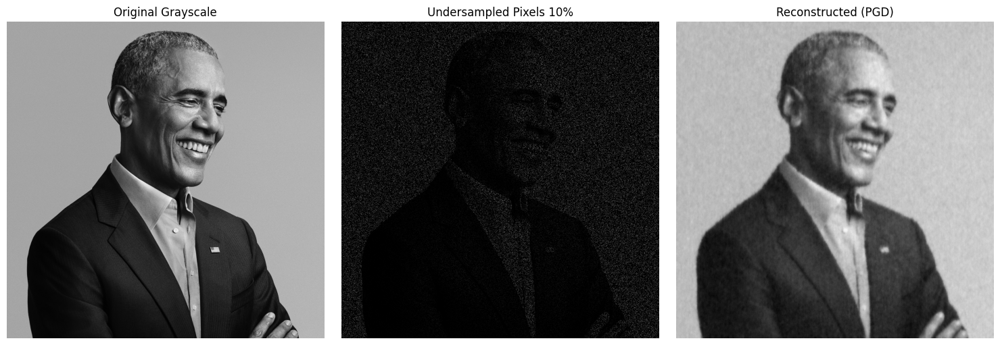

100%|██████████| 1000/1000 [02:24<00:00,  6.94it/s]


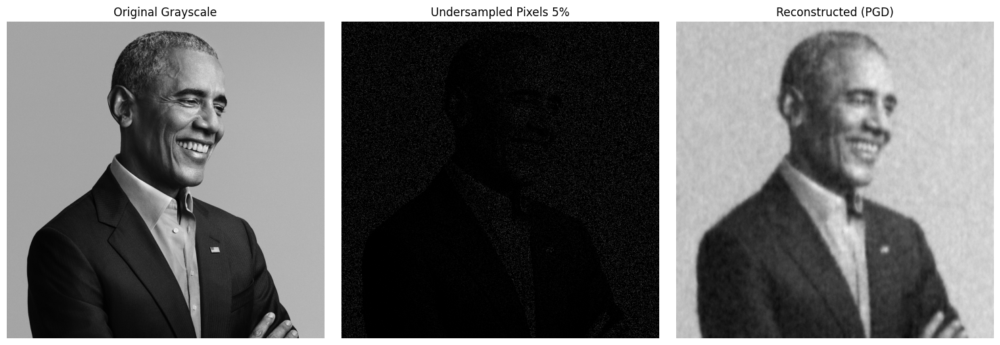

100%|██████████| 1000/1000 [02:26<00:00,  6.81it/s]


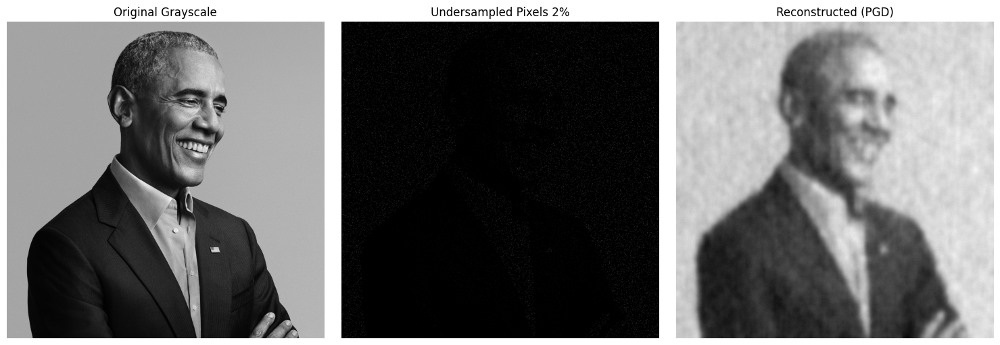

100%|██████████| 1000/1000 [02:27<00:00,  6.76it/s]


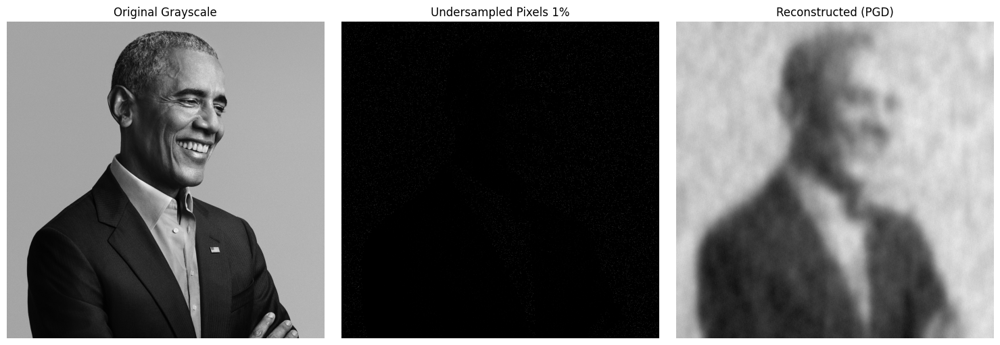

In [ ]:
#Original CPU Version

import numpy.random as npr
import scipy.fft as fft
from numpy.linalg import norm
from tqdm import tqdm

def dct2(x):
    return fft.dctn(x, type=2, norm='ortho')

def idct2(x):
    return fft.idctn(x, type=2, norm='ortho')

# Proximal gradient descent
def soft_threshold(x, thresh):
    return np.sign(x) * np.maximum(np.abs(x) - thresh, 0)

# Proximal gradient descent in this case:
def proximal_gradient_sparse_pixels(y, mask, image_shape, lamb=0.01, step=1.0, max_iter=300):
    alpha = np.zeros(image_shape)
    for i in tqdm(range(max_iter)):
        x = idct2(alpha)
        residual = np.zeros_like(x)
        residual[mask] = x[mask] - y
        grad = dct2(residual)
        alpha = alpha - step * grad
        alpha = soft_threshold(alpha, lamb * step)
    return idct2(alpha)

# Main process steps
def reconstruct_by_sampling_ratio(sampling_ratio, image_gray):

    #Generate random sampling mask according to given sampling ratio
    mask_pixels = npr.rand(*image_gray.shape) < sampling_ratio

    #Sample the image with the mask
    y_pixels = image_gray[mask_pixels]

    #Run PGD on the sparsely sampled image, return the resulting arrays
    image_reconstructed = proximal_gradient_sparse_pixels(
        y_pixels, mask_pixels, image_gray.shape, lamb=0.02, step=1.0, max_iter=1000
    )
    return sampling_ratio, mask_pixels, image_reconstructed

def plot_result(image_gray, sampling_ratio, mask_pixels, image_reconstructed):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(image_gray, cmap='gray')
    axs[0].set_title("Original Grayscale")
    axs[0].axis('off')

    masked_image = np.zeros_like(image_gray)
    masked_image[mask_pixels] = image_gray[mask_pixels]
    axs[1].imshow(masked_image, cmap='gray')
    axs[1].set_title(f"Undersampled Pixels {sampling_ratio*100:.0f}%")
    axs[1].axis('off')

    axs[2].imshow(image_reconstructed, cmap='gray')
    axs[2].set_title("Reconstructed (PGD)")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# Sampling ratios to test

sampling_ratios = [0.5, 0.25, 0.1, 0.05, 0.02, 0.01]

# For loop to test on the above values

for sampling_ratio in sampling_ratios:
    sampling_ratio, mask_pixels, image_reconstructed = reconstruct_by_sampling_ratio(sampling_ratio, image_gray)
    plot_result(image_gray, sampling_ratio, mask_pixels, image_reconstructed)